## Simple Object Recognition


In [ ]:
import cv2
import math
import numpy as np
import random as rng
from matplotlib import pyplot as plt
from ipywidgets import interact
import ipywidgets as widgets
from IPython.display import display, HTML,clear_output
%matplotlib inline

## Maker Based Segmentation

In this section, we will learn how to apply a classic segmentation algorithm named <b>watershed</b>. This algorithm can be used to detect and extract objects in images that are <b>touching and/or overlapping</b> (like RBC in previous Lab!).

Assume that we want to build an application to count coins value from the following image. First of all, we need to segment each coins in to a individual connected component.

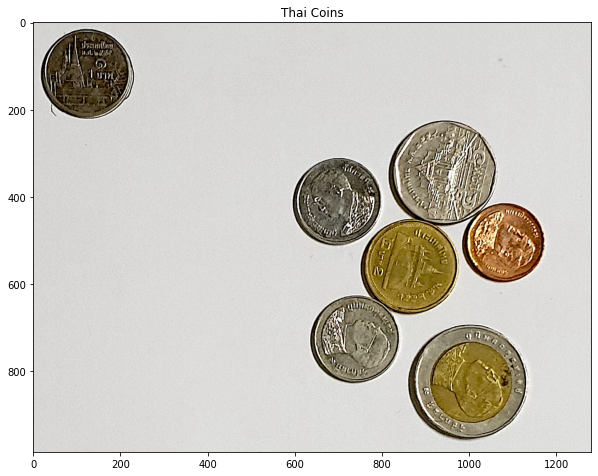

In [ ]:
sampleCoinImage = cv2.imread("assets/Lab6-AssignmentC1.jpg")
sampleCoinGray = cv2.cvtColor(sampleCoinImage,cv2.COLOR_BGR2GRAY)
tempImage = cv2.cvtColor(sampleCoinImage,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,10))
plt.title("Thai Coins")
plt.imshow(tempImage)
plt.show()

The following blocks try to use edge information from previous lecture to seperate coins image into individual coin.
Standard Sobel operator is used to extract edge information and only strong edge pixels are kept based on defined threshold. Try to adjust the edge threshold value to seperate each coin from others

In [ ]:
def extractSobelEdge(thresholdEdgeVal):
    sampleCoinGrayBlur = cv2.blur(sampleCoinGray,(15,15))
    sobelX = np.uint8(np.absolute(cv2.Sobel(sampleCoinGrayBlur,cv2.CV_64F,1,0,ksize=3)))
    sobelY = np.uint8(np.absolute(cv2.Sobel(sampleCoinGrayBlur,cv2.CV_64F,0,1,ksize=3)))
    sobelXY = (sobelX + sobelY) > thresholdEdgeVal
    plt.figure(figsize=(10,10))
    plt.title("Edge Image")
    plt.imshow(sobelXY,cmap='gray')
    plt.show()
interact(extractSobelEdge, thresholdEdgeVal=widgets.IntSlider(min=0,max=255,step=1,value=1));

interactive(children=(IntSlider(value=1, description='thresholdEdgeVal', max=255), Output()), _dom_classes=('w…

You can see from the above threshold edge map, even we selects a precise edge threshold, we cannot segment connected coins into individual one. In order to use watershed algorithm, markers muse be place at the corresponded location of the objects in our image. The markers can be either manual define or calculate from various image processing techniques. We will start from using <a href="https://docs.opencv.org/3.4.2/d7/d4d/tutorial_py_thresholding.html">automatic Otsu thesholding</a>.

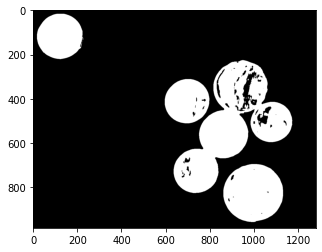

In [ ]:
sampleCoinGrayBlur = cv2.medianBlur(sampleCoinGray, 13)
_,thresholdCoinImage = cv2.threshold(sampleCoinGrayBlur,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

plt.imshow(thresholdCoinImage, cmap='gray')
plt.show()

This image gray levels can be visualized as follows

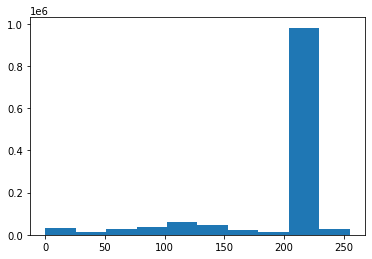

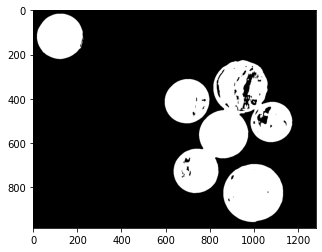

In [ ]:
plt.hist(sampleCoinGray.flatten())
plt.show()

plt.imshow(sampleCoinGrayBlur <165, cmap='gray') # we can manually select a proper theshold value to sperate between background and foreground
plt.show()

We then apply <a href="https://docs.opencv.org/3.4.2/d7/d1b/group__imgproc__misc.html#ga8a0b7fdfcb7a13dde018988ba3a43042">distance transform</a> to the thresholding output. Distance transform calculates the approximate or precise distance from every binary image pixel to the nearest zero pixel

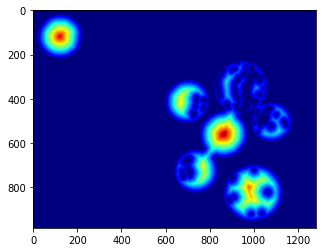

In [ ]:
distanceTransformOutput = cv2.distanceTransform(thresholdCoinImage,cv2.DIST_L2, 3)
plt.imshow(distanceTransformOutput,cmap='jet')
plt.show()

Pick only pixel which is greater than 45% of max distance as potential coin markers.

Max Distance: 104.0952


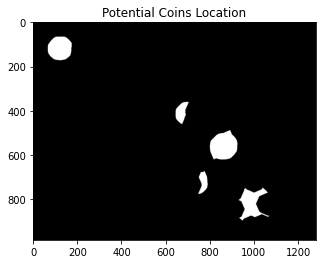

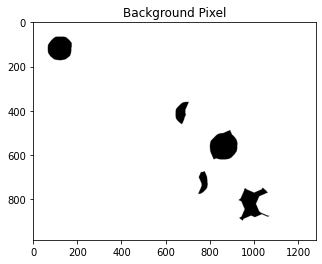

In [ ]:
maxDistance = np.max(distanceTransformOutput)
print('Max Distance:',maxDistance)
roughMarkerPixel = np.uint8(distanceTransformOutput > 0.45 * maxDistance)
backgroundMask = np.invert(roughMarkerPixel)
plt.title('Potential Coins Location')
plt.imshow(roughMarkerPixel, cmap='gray')
plt.show()

plt.figure()
plt.title('Background Pixel')
plt.imshow(backgroundMask, cmap='gray')
plt.show()

Labeling each connected component with its unique label number by using <a href="https://docs.opencv.org/3.4.2/d3/dc0/group__imgproc__shape.html#gaedef8c7340499ca391d459122e51bef5">cv2.connectedComponents</a>.

Computes the connected components labeled image of boolean image
image with 4 or 8 way connectivity - returns N, the total number of labels [0, N-1] where 0 represents the background label

Min Label: 0 Max Label: 5


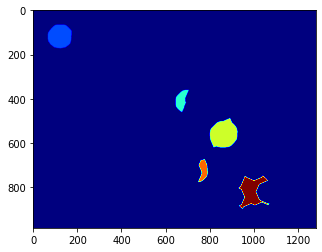

In [ ]:
_, seed = cv2.connectedComponents(roughMarkerPixel)
print('Min Label:',np.min(seed),'Max Label:',np.max(seed))
plt.imshow(seed,cmap='jet')
plt.show()

Apply <a href="https://docs.opencv.org/3.4.2/d7/d1b/group__imgproc__misc.html#ga3267243e4d3f95165d55a618c65ac6e1">watershed algorithm</a> using created marker and input coins image. Is there any missing coin? Why? Fix the bug and state your instruction in below block.

Min Label: -1 Max Label: 5


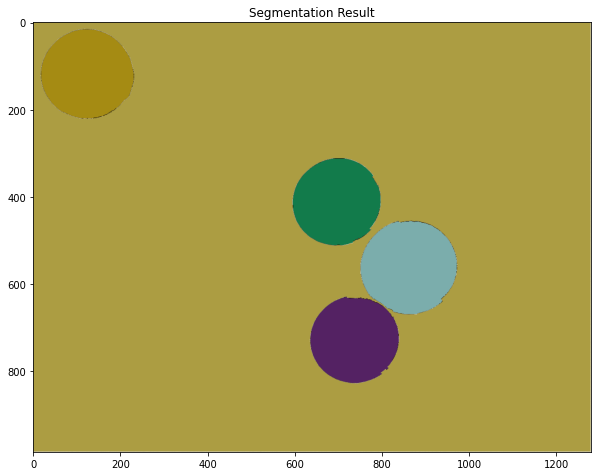

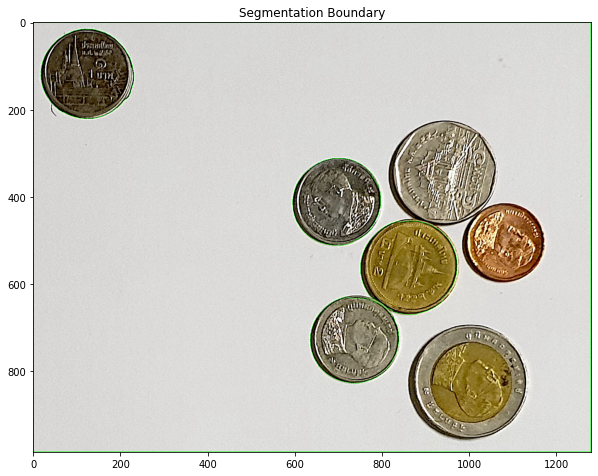

In [ ]:
outputImage = sampleCoinImage.copy()
borderImage = sampleCoinImage.copy()
outputMarkers = cv2.watershed(outputImage,seed) ### Warning seed will get modified here!!
# -1 is border pixel  
print('Min Label:',np.min(outputMarkers),'Max Label:',np.max(outputMarkers))

# 1 is background 
for outputMarkerIdx in range(1,np.max(outputMarkers+1)):
    color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
    outputImage[np.where(outputMarkers == outputMarkerIdx)] = color
outputImage = cv2.cvtColor(outputImage,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.title('Segmentation Result')
plt.imshow(outputImage)
plt.show()

borderImage[np.where(outputMarkers == -1)] = (0,255,0)
borderImage = cv2.cvtColor(borderImage,cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10,10))
plt.title('Segmentation Boundary')
plt.imshow(borderImage)
plt.show()

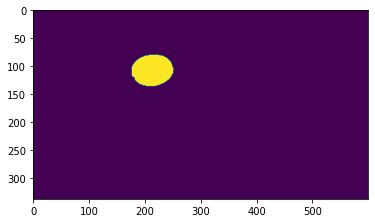

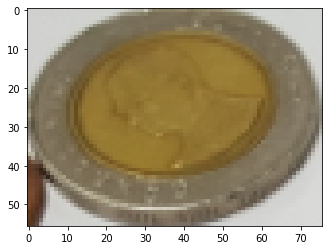

In [ ]:
### Crop out individual coin
firstCointMask = outputMarkers == 1
plt.imshow(firstCointMask)
plt.show()

contour, _ = cv2.findContours(firstCointMask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

x,y,w,h = cv2.boundingRect(contour[0])

cropCoinBGR = sampleCoinImage[y:y+h,x:x+w,:]
cropCoinRGB = cv2.cvtColor(cropCoinBGR, cv2.COLOR_BGR2RGB)
plt.imshow(cropCoinRGB)
plt.show()

### Assignment 1 - Coin Counter

From the above section, we can gracefully segment overlpping coins! Your today task is to implement a program to count total coin value from test images provided in assets folder. Please include two of your own test images by using smartphone camera. The images should show robustness of your designed alogorithm such as overlapping coins, tilt camera angle or shadow handling. Don't forget to show your work in step in below block. <br>(Optional) You will get extra points if you can use <b>same parameters</b> for all test images. :)

<b>Remark : </b>
- There are four test images in assets folder. Please hand in the recognition result in image files. 
- You should not count outlier object (key)!!!

<b>Basic Guidance:<b>
1. Segment each coin into individual connected component and find the bounding box which can enclose those connect components by <a href="https://docs.opencv.org/3.4.2/d3/dc0/group__imgproc__shape.html#gacb413ddce8e48ff3ca61ed7cf626a366">cv2.boundingRect</a>
2. For each component, extract <b>useful features</b> (you have to design this by youself).
3. Classify those components into Thai Coin classes.  

<b>Hints:</b>
- How do to discard noise/fill small hole from segmentation mask output? (Previous Lab?)
- Smoothing input image before apply thresholding by using <a href="https://docs.opencv.org/4.5.1/d4/d86/group__imgproc__filter.html#ga8c45db9afe636703801b0b2e440fce37">cv2.blur</a>, <a href="https://docs.opencv.org/4.5.1/d4/d86/group__imgproc__filter.html#ga564869aa33e58769b4469101aac458f9">cv2.medianFilter</a> or <a href="https://docs.opencv.org/4.5.1/d4/d86/group__imgproc__filter.html#ga9fabdce9543bd602445f5db3827e4cc0">cv2.pyrMeanShiftFiltering</a> might be able to improve threshold result.


In [318]:
def plot_img(img,title=None,cmap=None,figsize=(5,5)):
  plt.figure(figsize=figsize)
  if cmap:  plt.imshow(img,cmap=cmap)
  else: plt.imshow(img)
  if title: plt.title(title)
  plt.show()

def coin_segment( inv_thres,pyrMean_sp,pyrMean_sr, HCir_minDist, HCir_Canny, HCir_AcThres ,HCir_minRadius, HCir_maxRadius):
  global img 
  sampleCoinImage = img.copy()
  rgb_img = cv2.cvtColor(sampleCoinImage,cv2.COLOR_BGR2RGB)
  shifted_img = cv2.pyrMeanShiftFiltering(sampleCoinImage, pyrMean_sp, pyrMean_sr) #https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#ga9fabdce9543bd602445f5db3827e4cc0


  sampleCoinGrayBlurx = cv2.blur(sampleCoinImage, (5,5))
  # sampleCoinGrayBlurx = cv2.medianBlur(sampleCoinImage, 21)
  sampleCoinGray = cv2.cvtColor(shifted_img,cv2.COLOR_BGR2GRAY)




  plot_img(rgb_img,'input_img')
  plot_img(cv2.cvtColor(shifted_img,cv2.COLOR_BGR2RGB) ,'pyrMeanShift_img')
  plot_img(sampleCoinGray,'gray_img',cmap='gray')


 

  sampleCoinGrayBlur = cv2.medianBlur(sampleCoinGray, 13)
  plt.hist(sampleCoinGrayBlur.flatten())
  plt.show()
  # _,thresholdCoinImage = cv2.threshold(sampleCoinGrayBlur,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
  _,thresholdCoinImage = cv2.threshold(sampleCoinGrayBlur,inv_thres,255,cv2.THRESH_BINARY_INV )
  plt.imshow(thresholdCoinImage, cmap='gray')
  plt.show()

  plt.hist(thresholdCoinImage.flatten())
  plt.show()


  kernel_size = 5
  kernel = np.zeros((kernel_size,kernel_size),np.uint8)
  cv2.circle(kernel,(kernel_size//2,kernel_size//2),kernel_size//2,1,-1)
  print(kernel)

  thresholdCoinImage = cv2.morphologyEx(thresholdCoinImage, cv2.MORPH_OPEN, kernel, iterations=10)

  # thresholdCoinImage = cv2.erode(thresholdCoinImage, kernel, iterations=5)
  # thresholdCoinImage = cv2.dilate(thresholdCoinImage, kernel, iterations=7)
  # thresholdCoinImage = cv2.erode(thresholdCoinImage, kernel, iterations=5)
  # thresholdCoinImage = cv2.morphologyEx(thresholdCoinImage, cv2.MORPH_CLOSE, kernel, iterations=10)
  # thresholdCoinImage = cv2.erode(thresholdCoinImage, (10,10), iterations=10)

  plot_img(thresholdCoinImage,'closed_threshold',cmap='gray',figsize=(10,10))

  distanceTransformOutput = cv2.distanceTransform(thresholdCoinImage,cv2.DIST_L2, 5)
  plt.imshow(distanceTransformOutput,cmap='jet')
  plt.show()

  maxDistance = np.max(distanceTransformOutput)
  print('Max Distance:',maxDistance)
  roughMarkerPixel = np.uint8(distanceTransformOutput > 0.60 * maxDistance)
  backgroundMask = np.invert(roughMarkerPixel)
  plt.title('Potential Coins Location')
  plt.imshow(roughMarkerPixel, cmap='gray')
  plt.show()

  plt.figure()
  plt.title('Background Pixel')
  plt.imshow(backgroundMask, cmap='gray')
  plt.show()

  # _, seed = cv2.connectedComponents(roughMarkerPixel)
  output = cv2.connectedComponentsWithStats(roughMarkerPixel, connectivity=8)
  num_labels = output[0]
  seed = output[1]
  stats = output[2]
  centroids = output[3]
  print('Min Label:',np.min(seed),'Max Label:',np.max(seed))
  plot_img(seed,'connected_components',cmap='jet')




  seed[:10,:10] = np.max(seed)+1 # modify for watershed purpose

  outputImage = sampleCoinGrayBlurx.copy()
  borderImage = sampleCoinImage.copy()
  outputMarkers = cv2.watershed(outputImage,seed) ### Warning seed will get modified here!!
  # -1 is border pixel  
  print('Min Label:',np.min(outputMarkers),'Max Label:',np.max(outputMarkers))

  # 1 is background 
  for outputMarkerIdx in range(1,np.max(outputMarkers+1)):
      color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
      outputImage[np.where(outputMarkers == outputMarkerIdx)] = color
  outputImage = cv2.cvtColor(outputImage,cv2.COLOR_BGR2RGB)


  plot_img(outputImage,'watershed Segmentation Result', figsize=(10,10))


  minDist = HCir_minDist #100
  param1 =  HCir_Canny #30 #500
  param2 = HCir_AcThres #10 #200 #smaller value-> more false circles
  minRadius = HCir_minRadius #5
  maxRadius = HCir_maxRadius # 500 #10

  circles = cv2.HoughCircles(cv2.cvtColor(outputImage,cv2.COLOR_RGB2GRAY) , cv2.HOUGH_GRADIENT, 1, minDist, param1=param1, param2=param2, minRadius=minRadius, maxRadius=maxRadius)
  outputHough = np.copy(rgb_img)
  outputHough_watershed  = np.copy(rgb_img.copy())
  Hough_masks = [ np.zeros(outputImage.shape[:-1],dtype=np.uint8) for _ in range(len(circles[0,:])) ]
  Hough_coors = [] 
  if circles is not None:
      circles = np.uint16(np.around(circles))
      for n,i in enumerate(circles[0,:]):
          x,y,r  = i[0], i[1], i[2]
          cv2.circle(outputHough, (x, y), r, (255,0 , 0), 2)
          cv2.circle(outputHough_watershed, (x, y), r, (255,0 , 0), 2)
          cv2.circle(Hough_masks[n], (x, y), r, 1 , -1)  
          Hough_coors.append((x,y,r))

  # Show result for testing:

  plot_img(outputHough_watershed,'Hough_on_watershed',figsize=(10,10))
  plot_img(outputHough,'Hough_Transform',figsize=(10,10))
  

  borderImage[np.where(outputMarkers == -1)] = (0,0,255)
  borderImage = cv2.cvtColor(borderImage,cv2.COLOR_BGR2RGB)
  plot_img(borderImage,'Segmentation Boundary',figsize=(10,10))

  # print("***** hough mask")
  # for h in Hough_masks: plot_img(h)


  # Hough refined
  def IoU(img1,img2):
    # expect boolean img1,img2
    return np.sum(img1&img2)/np.sum(img1|img2) 
    
  refined_markers = np.copy(outputMarkers)
  refined_segment = sampleCoinImage.copy()
  IoU_Hcir_threshold=0.5
  # outputRefinedHough[np.where(outputMarkers == outputMarkerIdx)] = (255,255,255)
  for outputMarkerIdx in range(1,np.max(outputMarkers+1)):
      color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
      if np.any([  IoU(outputMarkers == outputMarkerIdx, hough_mask == 1) > IoU_Hcir_threshold  for hough_mask in Hough_masks  ]) :
        refined_segment[np.where(outputMarkers == outputMarkerIdx)] = color
      else:  refined_markers[np.where(outputMarkers == outputMarkerIdx)] = 0
  refined_segment = cv2.cvtColor(refined_segment,cv2.COLOR_BGR2RGB)
  plot_img(refined_segment,'refined_segment',figsize=(10,10))


  filtered_Hough_mask = []
  filtered_Hough_coors = []
  for i,hough_mask in enumerate(Hough_masks):
    # print( IoU(refined_markers == 1, hough_mask == 1) > IoU_Hcir_threshold)
    # print([  IoU(refined_markers == j, hough_mask == 1) > IoU_Hcir_threshold for j in range( 1,max(refined_markers+1))  ])

    if np.any([  IoU(refined_markers == j, hough_mask == 1) > IoU_Hcir_threshold for j in range( 1,np.max(refined_markers)+1)  ]) :
      filtered_Hough_mask.append(Hough_masks[i])
      filtered_Hough_coors.append(Hough_coors[i])

  refined_Hough_segment = rgb_img.copy()
  for ccoor in  filtered_Hough_coors:
    x,y,r = ccoor 
    cv2.circle(refined_Hough_segment, (x, y), r, (255,0,0) , 5)
    
    # plot_img(rgb_img[ x-r:x+r ,y-r:y+r])
  plot_img(refined_Hough_segment,'refined_Hough_segment',figsize=(10,10)) 

  # for mask in filtered_Hough_mask: plot_img( rgb_img[mask==1])

  def cir_crops(c_coors, img):
    for (x,y,r) in c_coors: 
      print((x,y,r))
      print( x-r,x+r,y-r,y+r)
    return  [  img[y-r:y+r, x-r:x+r]  for (x,y,r) in c_coors   ]  #*** (x,y) of Circle  == (y,x) in Array 

  crops =  cir_crops(filtered_Hough_coors, rgb_img.copy())
  # print(f'crops.shape {crops.shape}')
  for c in crops: print(c.shape)
  for crop in crops: 
    plot_img(crop)
      
    


img = cv2.imread("assets/Lab6-AssignmentC3.jpg")
# img = cv2.imread("assets/mytest1.jpg")

# thres: 200 --> 150
# pyrMean_sr: 180
# pyrMean_sp: 20
# HCir_min: 60 --> 1250
# HCir_maxRadius: 150 -->247
interact(coin_segment,
         inv_thres=widgets.IntSlider(min=0,max=256,step=1,value=200),
         pyrMean_sp=widgets.IntSlider(min=0,max=256,step=1,value=20),
         pyrMean_sr=widgets.IntSlider(min=0,max=256,step=1,value=180),
         HCir_minDist=widgets.IntSlider(min=0,max=1000,step=1,value=70),
         HCir_Canny=widgets.IntSlider(min=0,max=1000,step=1,value=50), 
         HCir_AcThres=widgets.IntSlider(min=0,max=1000,step=1,value=20),
         HCir_minRadius=widgets.IntSlider(min=0,max=1000,step=1,value=60),
         HCir_maxRadius=widgets.IntSlider(min=0,max=1000,step=1,value=150)
         )



interactive(children=(IntSlider(value=200, description='inv_thres', max=256), IntSlider(value=20, description=…

<function __main__.coin_segment>

In [323]:
def plot_img(img,title=None,cmap=None,figsize=(5,5)):
  plt.figure(figsize=figsize)
  if cmap:  plt.imshow(img,cmap=cmap)
  else: plt.imshow(img)
  if title: plt.title(title)
  plt.show()


def save_img(img,fname):
  cv2.imwrite(fname,cv2.cvtColor(img,cv2.COLOR_RGB2BGR))
def coin_segment( img, inv_thres,pyrMean_sp,pyrMean_sr, HCir_minDist, HCir_Canny, HCir_AcThres ,HCir_minRadius, HCir_maxRadius):
  sampleCoinImage = img.copy()
  rgb_img = cv2.cvtColor(sampleCoinImage,cv2.COLOR_BGR2RGB)
  shifted_img = cv2.pyrMeanShiftFiltering(sampleCoinImage, pyrMean_sp, pyrMean_sr) #https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#ga9fabdce9543bd602445f5db3827e4cc0

  sampleCoinGrayBlurx = cv2.blur(sampleCoinImage, (5,5))
  # sampleCoinGrayBlurx = cv2.medianBlur(sampleCoinImage, 21)
  sampleCoinGray = cv2.cvtColor(shifted_img,cv2.COLOR_BGR2GRAY)




  plot_img(rgb_img,'input_img')
  plot_img(cv2.cvtColor(shifted_img,cv2.COLOR_BGR2RGB) ,'pyrMeanShift_img')
  plot_img(sampleCoinGray,'gray_img',cmap='gray')


 

  sampleCoinGrayBlur = cv2.medianBlur(sampleCoinGray, 13)
  plt.hist(sampleCoinGrayBlur.flatten())
  plt.show()
  # _,thresholdCoinImage = cv2.threshold(sampleCoinGrayBlur,0,255,cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
  _,thresholdCoinImage = cv2.threshold(sampleCoinGrayBlur,inv_thres,255,cv2.THRESH_BINARY_INV )
  plt.imshow(thresholdCoinImage, cmap='gray')
  plt.show()

  plt.hist(thresholdCoinImage.flatten())
  plt.show()


  kernel_size = 5
  kernel = np.zeros((kernel_size,kernel_size),np.uint8)
  cv2.circle(kernel,(kernel_size//2,kernel_size//2),kernel_size//2,1,-1)
  print(kernel)

  thresholdCoinImage = cv2.morphologyEx(thresholdCoinImage, cv2.MORPH_OPEN, kernel, iterations=10)

  # thresholdCoinImage = cv2.erode(thresholdCoinImage, kernel, iterations=5)
  # thresholdCoinImage = cv2.dilate(thresholdCoinImage, kernel, iterations=7)
  # thresholdCoinImage = cv2.erode(thresholdCoinImage, kernel, iterations=5)
  # thresholdCoinImage = cv2.morphologyEx(thresholdCoinImage, cv2.MORPH_CLOSE, kernel, iterations=10)
  # thresholdCoinImage = cv2.erode(thresholdCoinImage, (10,10), iterations=10)

  plot_img(thresholdCoinImage,'closed_threshold',cmap='gray',figsize=(10,10))

  distanceTransformOutput = cv2.distanceTransform(thresholdCoinImage,cv2.DIST_L2, 5)
  plt.imshow(distanceTransformOutput,cmap='jet')
  plt.show()

  maxDistance = np.max(distanceTransformOutput)
  print('Max Distance:',maxDistance)
  roughMarkerPixel = np.uint8(distanceTransformOutput > 0.4 * maxDistance)
  backgroundMask = np.invert(roughMarkerPixel)
  plt.title('Potential Coins Location')
  plt.imshow(roughMarkerPixel, cmap='gray')
  plt.show()

  plt.figure()
  plt.title('Background Pixel')
  plt.imshow(backgroundMask, cmap='gray')
  plt.show()

  # _, seed = cv2.connectedComponents(roughMarkerPixel)
  output = cv2.connectedComponentsWithStats(roughMarkerPixel, connectivity=8)
  num_labels = output[0]
  seed = output[1]
  stats = output[2]
  centroids = output[3]
  print('Min Label:',np.min(seed),'Max Label:',np.max(seed))
  plot_img(seed,'connected_components',cmap='jet')




  seed[:10,:10] = np.max(seed)+1 # modify for watershed purpose

  outputImage = sampleCoinGrayBlurx.copy()
  borderImage = sampleCoinImage.copy()
  outputMarkers = cv2.watershed(outputImage,seed) ### Warning seed will get modified here!!
  # -1 is border pixel  
  print('Min Label:',np.min(outputMarkers),'Max Label:',np.max(outputMarkers))

  # 1 is background 
  for outputMarkerIdx in range(1,np.max(outputMarkers+1)):
      color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
      outputImage[np.where(outputMarkers == outputMarkerIdx)] = color
  outputImage = cv2.cvtColor(outputImage,cv2.COLOR_BGR2RGB)


  plot_img(outputImage,'watershed Segmentation Result', figsize=(10,10))


  minDist = HCir_minDist #100
  param1 =  HCir_Canny #30 #500
  param2 = HCir_AcThres #10 #200 #smaller value-> more false circles
  minRadius = HCir_minRadius #5
  maxRadius = HCir_maxRadius # 500 #10

  circles = cv2.HoughCircles(cv2.cvtColor(outputImage,cv2.COLOR_RGB2GRAY) , cv2.HOUGH_GRADIENT, 1, minDist, param1=param1, param2=param2, minRadius=minRadius, maxRadius=maxRadius)
  outputHough = np.copy(rgb_img)
  outputHough_watershed  = np.copy(rgb_img.copy())
  Hough_masks = [ np.zeros(outputImage.shape[:-1],dtype=np.uint8) for _ in range(len(circles[0,:])) ]
  Hough_coors = [] 
  if circles is not None:
      circles = np.uint16(np.around(circles))
      for n,i in enumerate(circles[0,:]):
          x,y,r  = i[0], i[1], i[2]
          cv2.circle(outputHough, (x, y), r, (255,0 , 0), 2)
          cv2.circle(outputHough_watershed, (x, y), r, (255,0 , 0), 2)
          cv2.circle(Hough_masks[n], (x, y), r, 1 , -1)  
          Hough_coors.append((x,y,r))

  # Show result for testing:

  plot_img(outputHough_watershed,'Hough_on_watershed',figsize=(10,10))
  plot_img(outputHough,'Hough_Transform',figsize=(10,10))
  

  borderImage[np.where(outputMarkers == -1)] = (0,0,255)
  borderImage = cv2.cvtColor(borderImage,cv2.COLOR_BGR2RGB)
  plot_img(borderImage,'Segmentation Boundary',figsize=(10,10))

  # print("***** hough mask")
  # for h in Hough_masks: plot_img(h)


  # Hough refined
  def IoU(img1,img2):
    # expect boolean img1,img2
    return np.sum(img1&img2)/np.sum(img1|img2) 
    
  refined_markers = np.copy(outputMarkers)
  refined_segment = sampleCoinImage.copy()
  IoU_Hcir_threshold=0.6
  # outputRefinedHough[np.where(outputMarkers == outputMarkerIdx)] = (255,255,255)
  for outputMarkerIdx in range(1,np.max(outputMarkers+1)):
      color = (rng.randint(0,256), rng.randint(0,256), rng.randint(0,256))
      if np.any([  IoU(outputMarkers == outputMarkerIdx, hough_mask == 1) > IoU_Hcir_threshold  for hough_mask in Hough_masks  ]) :
        refined_segment[np.where(outputMarkers == outputMarkerIdx)] = color
      else:  refined_markers[np.where(outputMarkers == outputMarkerIdx)] = 0
  refined_segment = cv2.cvtColor(refined_segment,cv2.COLOR_BGR2RGB)
  plot_img(refined_segment,'refined_segment',figsize=(10,10))


  filtered_Hough_mask = []
  filtered_Hough_coors = []
  for i,hough_mask in enumerate(Hough_masks):
    # print( IoU(refined_markers == 1, hough_mask == 1) > IoU_Hcir_threshold)
    # print([  IoU(refined_markers == j, hough_mask == 1) > IoU_Hcir_threshold for j in range( 1,max(refined_markers+1))  ])

    if np.any([  IoU(refined_markers == j, hough_mask == 1) > IoU_Hcir_threshold for j in range( 1,np.max(refined_markers)+1)  ]) :
      filtered_Hough_mask.append(Hough_masks[i])
      filtered_Hough_coors.append(Hough_coors[i])

  refined_Hough_segment = rgb_img.copy()
  for ccoor in  filtered_Hough_coors:
    x,y,r = ccoor 
    cv2.circle(refined_Hough_segment, (x, y), r, (255,0,0) , 5)
    
    # plot_img(rgb_img[ x-r:x+r ,y-r:y+r])
  plot_img(refined_Hough_segment,'refined_Hough_segment',figsize=(10,10)) 

  # for mask in filtered_Hough_mask: plot_img( rgb_img[mask==1])

  def cir_crops(c_coors, img):
    return  [  img[y-r:y+r, x-r:x+r]  for (x,y,r) in c_coors   ]  #*** (x,y) of Circle  == (y,x) in Array 

  crops =  cir_crops(filtered_Hough_coors, rgb_img.copy())
  # print(f'crops.shape {crops.shape}')
  for c in crops: print(c.shape)
  for crop,coor in zip(crops,filtered_Hough_coors): 
    print(f'r: {coor[-1]}')
    plot_img(crop)


  save_img(shifted_img,'pyrMeanShift.jpg')
  save_img(outputImage,'watershed.jpg')
  save_img(outputHough_watershed,'Hough_watershed.jpg')
  save_img( refined_segment,'refined_segment.jpg')
  save_img( refined_Hough_segment,'refined_Hough_segment.jpg')
  return crops,filtered_Hough_coors
      
    


img = cv2.imread("assets/Lab6-AssignmentC3.jpg") #Lab6-SampleCoins
# img = cv2.imread("assets/Lab6-SampleCoins.jpg")

# thres: 200 --> 150
# pyrMean_sr: 180
# pyrMean_sp: 20
# HCir_min: 60 --> 1250
# HCir_maxRadius: 150 -->247
inv_thres=200
pyrMean_sp=20
pyrMean_sr=80
HCir_minDist=70
HCir_Canny=50
HCir_AcThres=20
HCir_minRadius=60
HCir_maxRadius=150

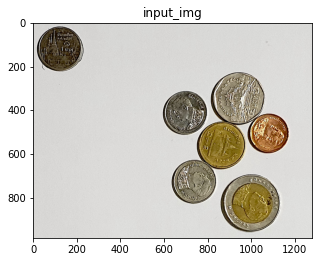

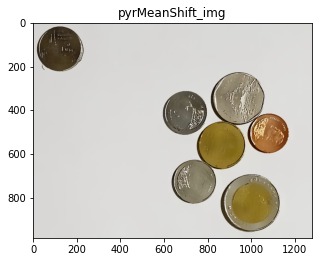

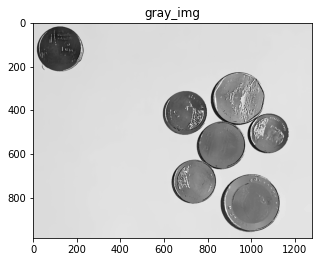

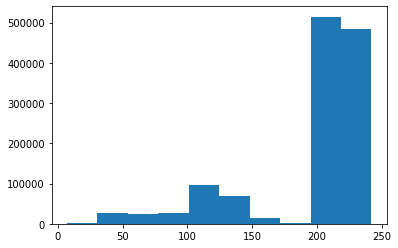

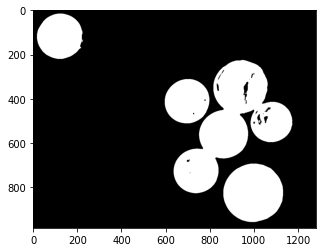

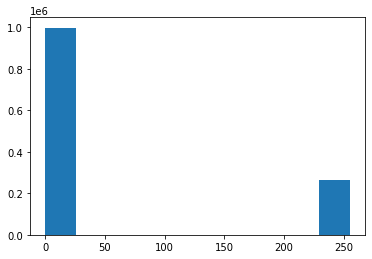

[[0 0 1 0 0]
 [0 1 1 1 0]
 [1 1 1 1 1]
 [0 1 1 1 0]
 [0 0 1 0 0]]


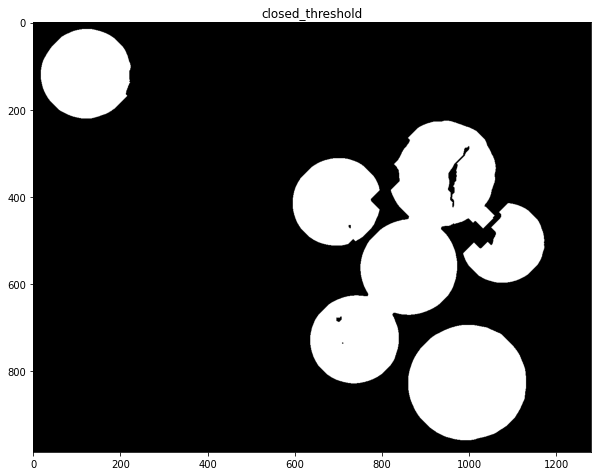

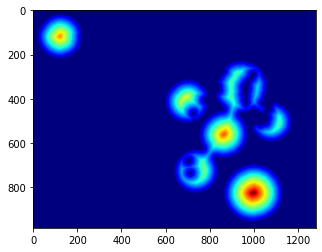

Max Distance: 129.42017


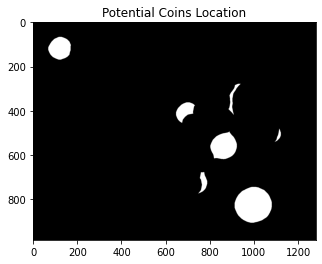

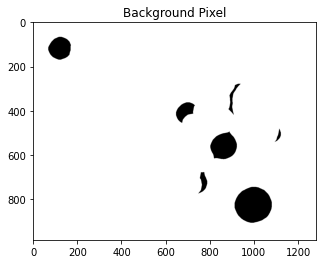

Min Label: 0 Max Label: 7


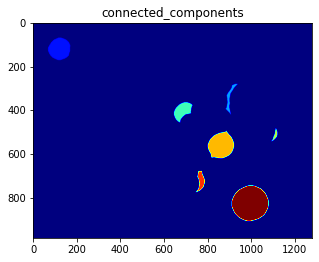

Min Label: -1 Max Label: 8


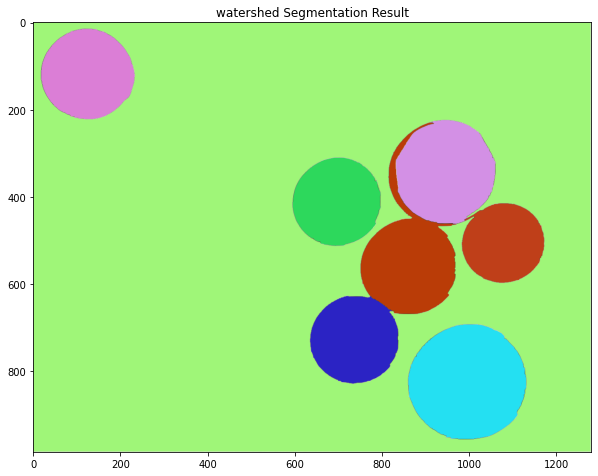

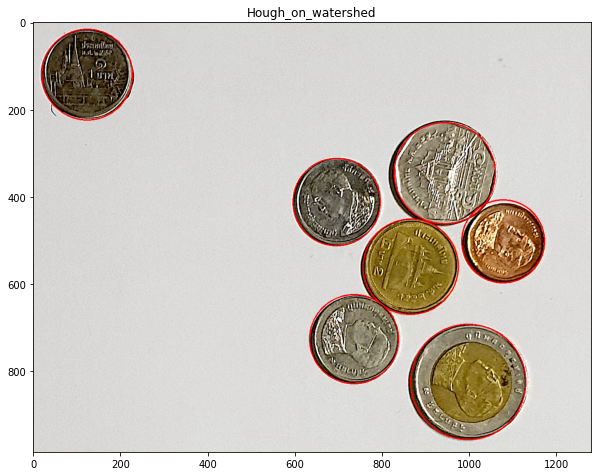

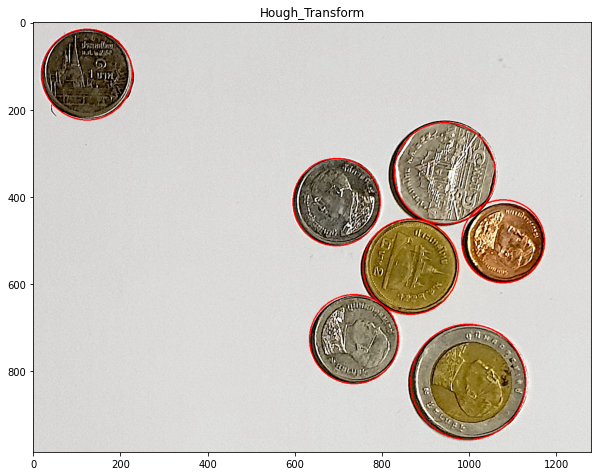

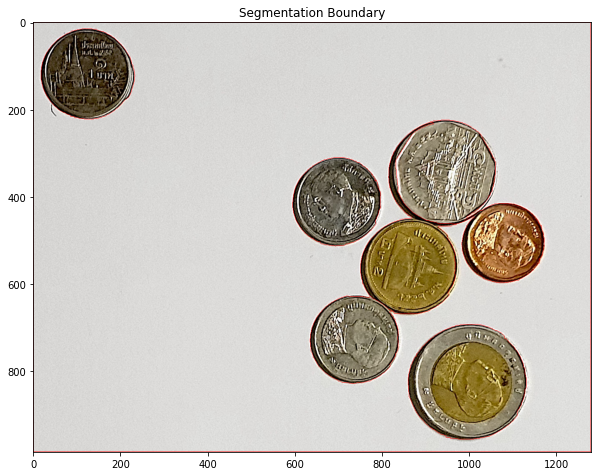

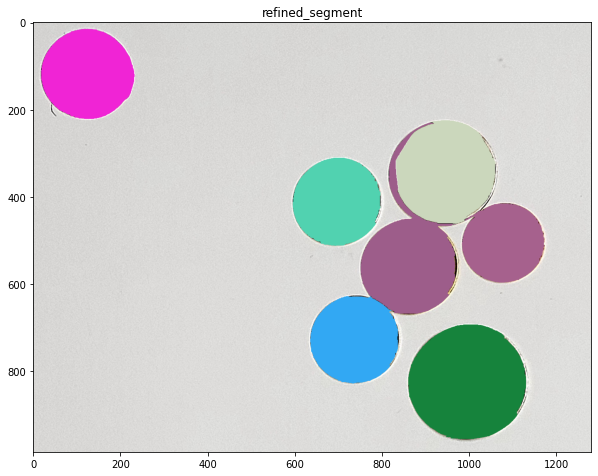

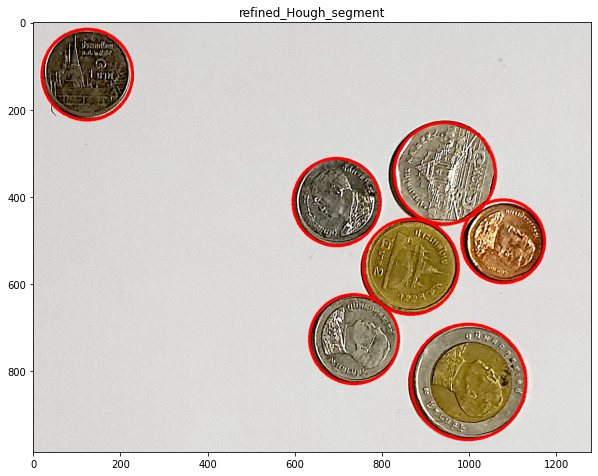

(208, 208, 3)
(204, 204, 3)
(190, 190, 3)
(264, 264, 3)
(232, 232, 3)
(200, 200, 3)
(218, 218, 3)
r: 104


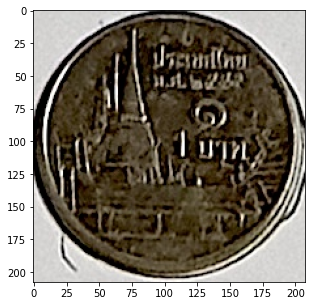

r: 102


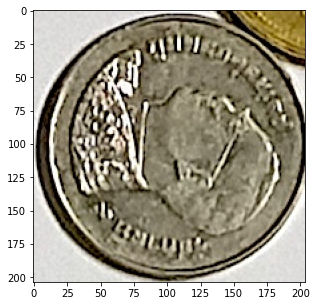

r: 95


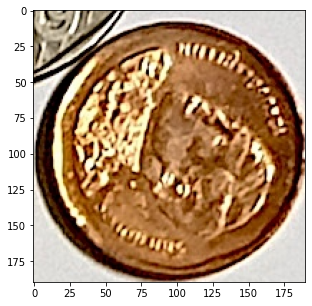

r: 132


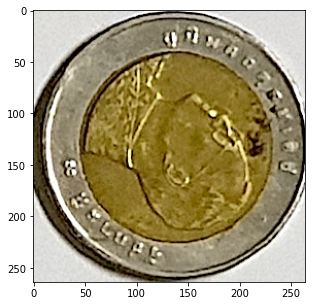

r: 116


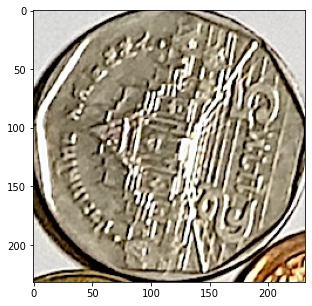

r: 100


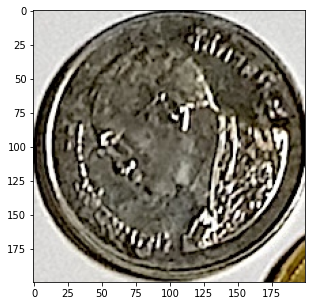

r: 109


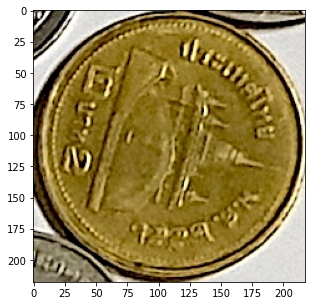

In [324]:
img = cv2.imread("assets/Lab6-AssignmentC1.jpg")
detections_C1,coors_C1 = coin_segment(img,inv_thres,pyrMean_sp,pyrMean_sr,HCir_minDist,HCir_Canny,HCir_AcThres,HCir_minRadius,HCir_maxRadius)


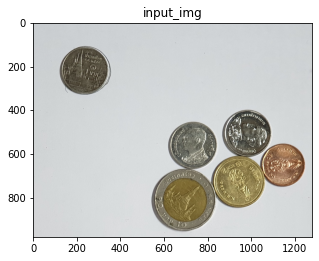

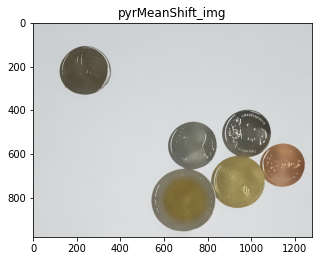

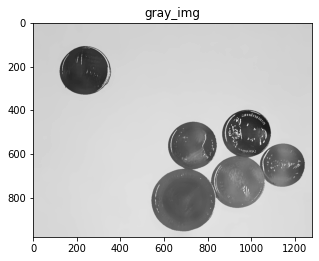

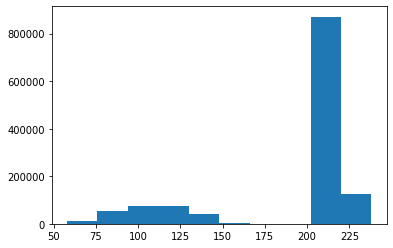

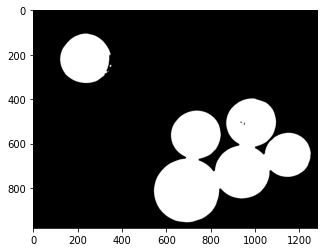

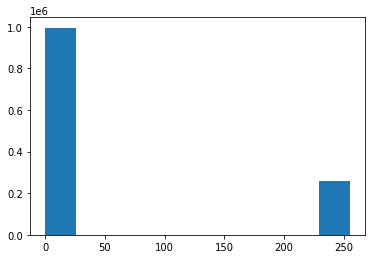

[[0 0 1 0 0]
 [0 1 1 1 0]
 [1 1 1 1 1]
 [0 1 1 1 0]
 [0 0 1 0 0]]


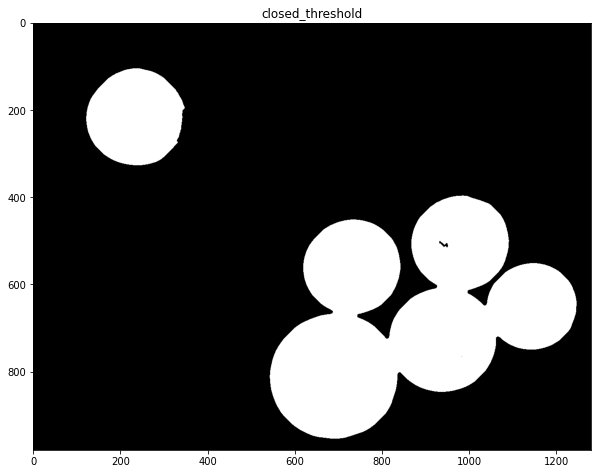

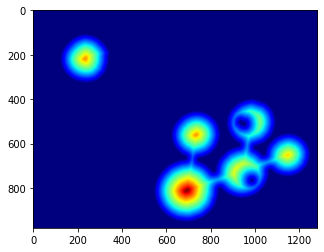

Max Distance: 140.40466


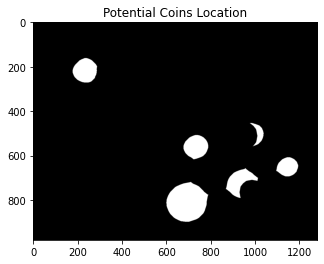

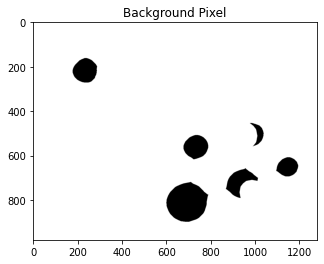

Min Label: 0 Max Label: 6


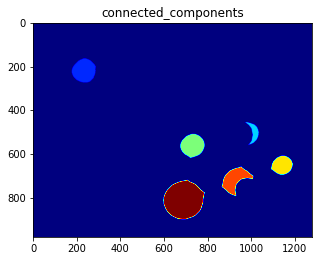

Min Label: -1 Max Label: 7


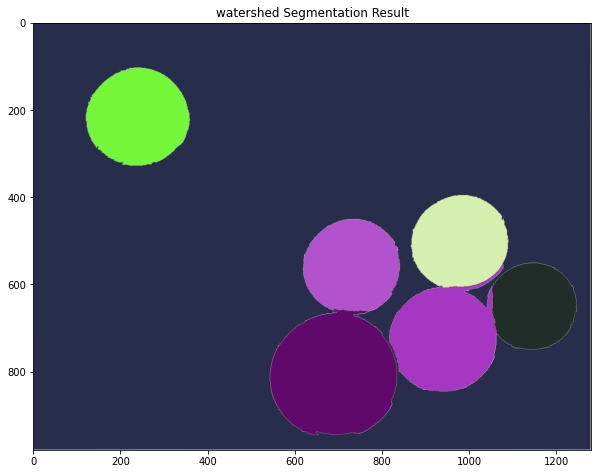

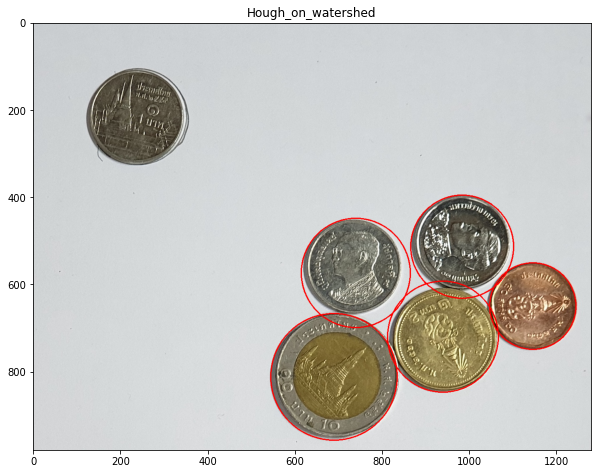

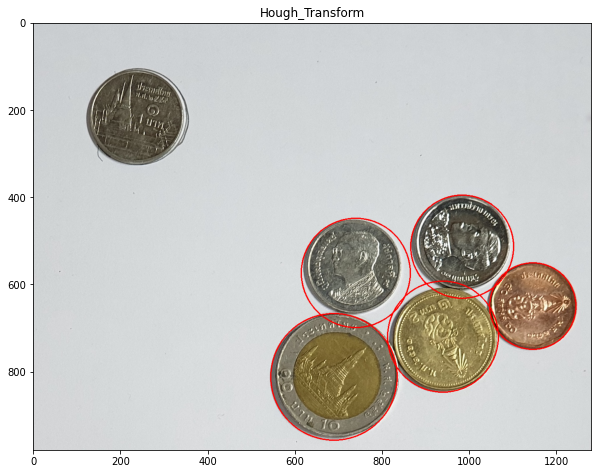

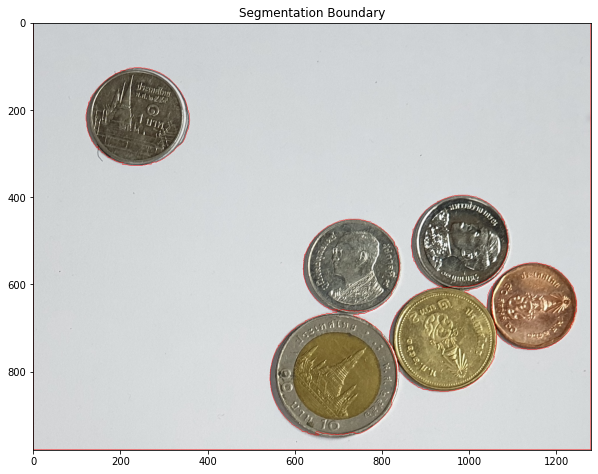

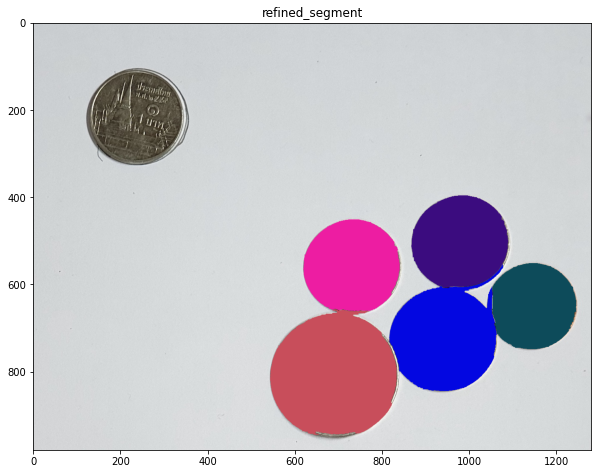

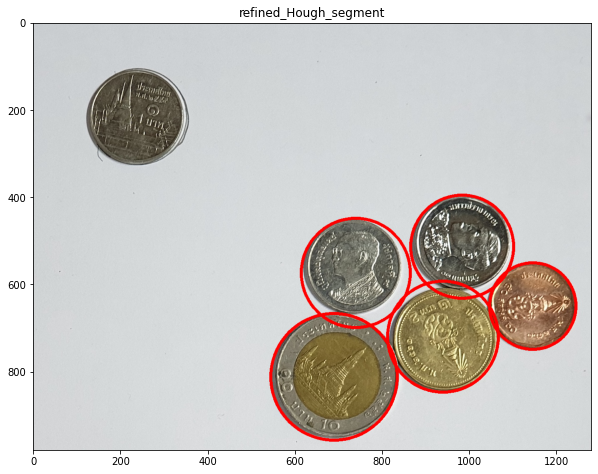

(290, 290, 3)
(198, 198, 3)
(236, 236, 3)
(254, 254, 3)
(250, 250, 3)
r: 145


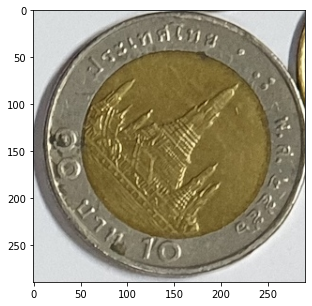

r: 99


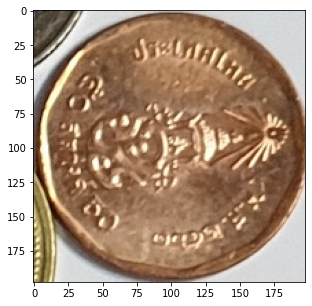

r: 118


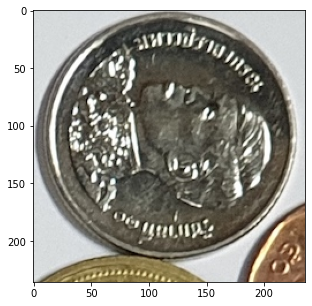

r: 127


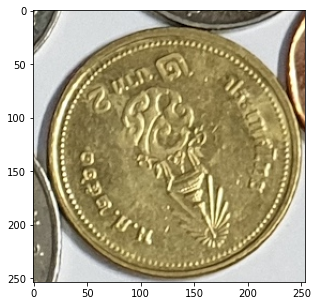

r: 125


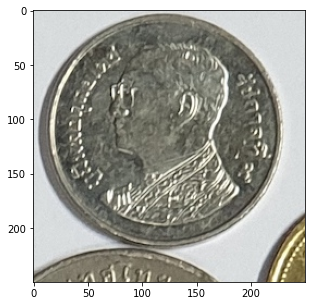

In [325]:
img = cv2.imread("assets/Lab6-AssignmentC2.jpg")
detections_C2,coors_C2 = coin_segment(img,inv_thres,pyrMean_sp,pyrMean_sr,HCir_minDist,HCir_Canny,HCir_AcThres,HCir_minRadius,HCir_maxRadius)


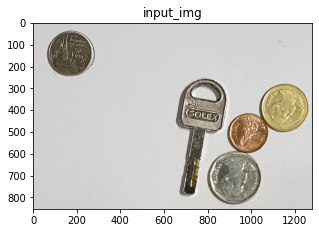

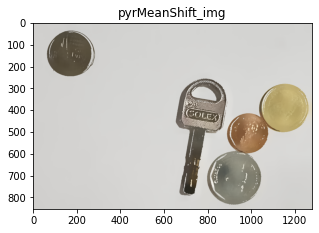

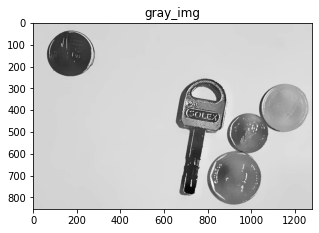

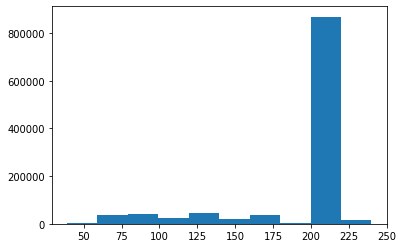

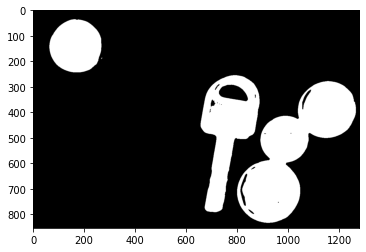

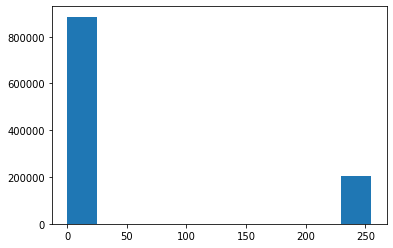

[[0 0 1 0 0]
 [0 1 1 1 0]
 [1 1 1 1 1]
 [0 1 1 1 0]
 [0 0 1 0 0]]


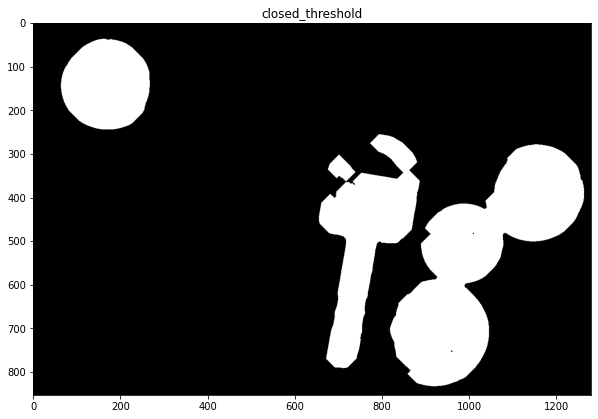

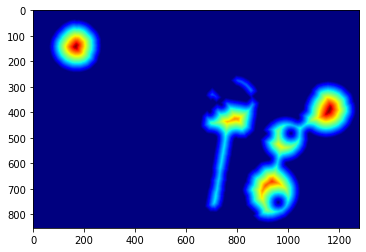

Max Distance: 99.86047


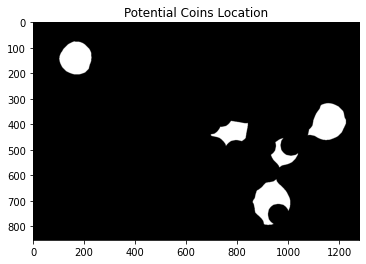

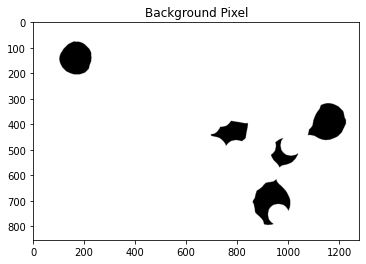

Min Label: 0 Max Label: 5


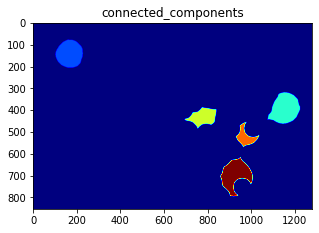

Min Label: -1 Max Label: 6


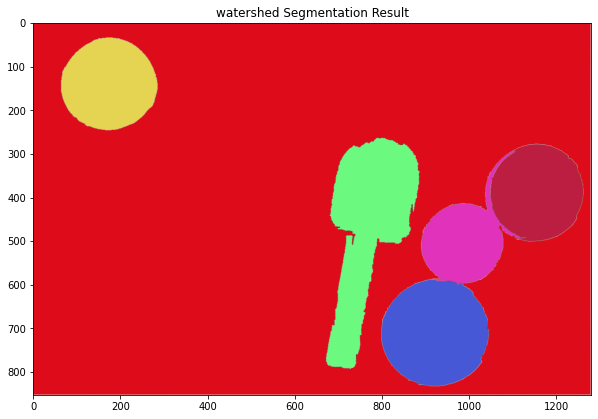

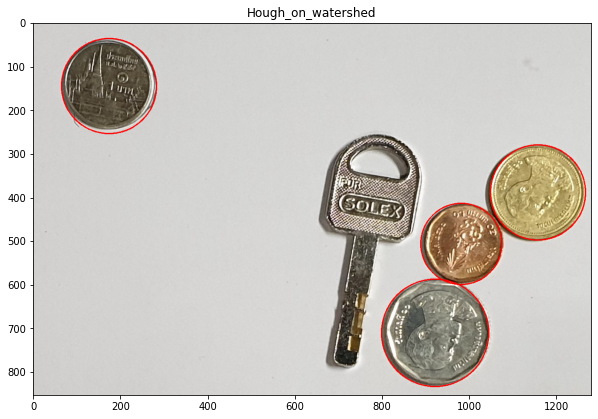

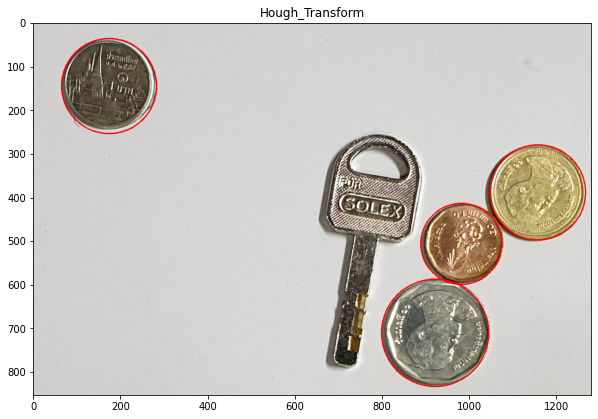

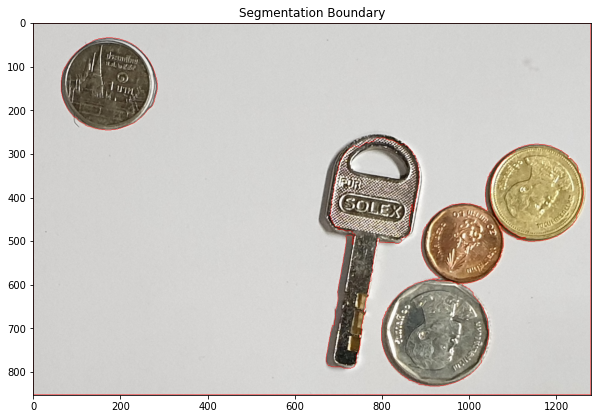

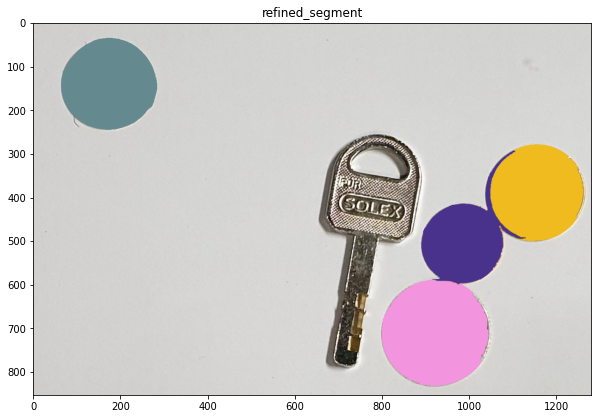

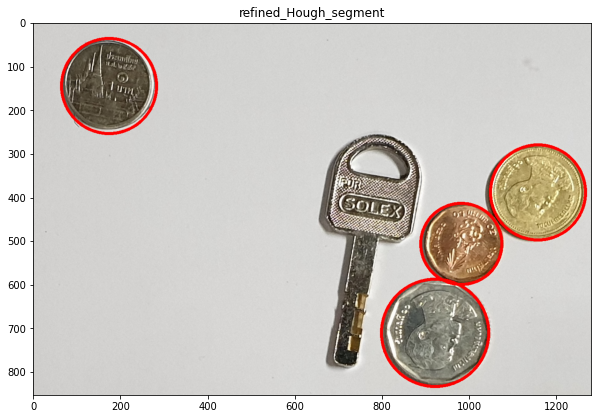

(246, 246, 3)
(218, 218, 3)
(186, 186, 3)
(218, 218, 3)
r: 123


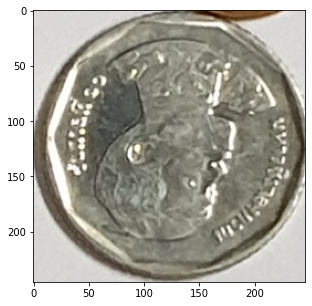

r: 109


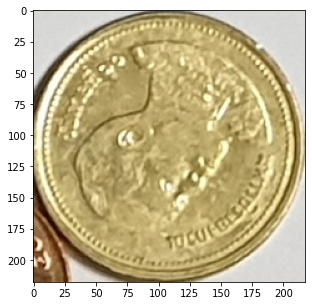

r: 93


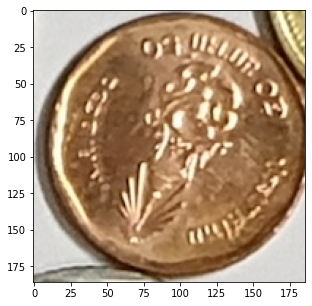

r: 109


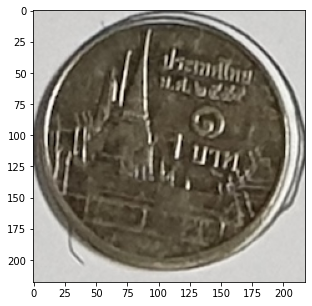

In [326]:
img = cv2.imread("assets/Lab6-AssignmentC3.jpg")
detections_C3,coors_C3 = coin_segment(img,inv_thres,pyrMean_sp,pyrMean_sr,HCir_minDist,HCir_Canny,HCir_AcThres,HCir_minRadius,HCir_maxRadius)


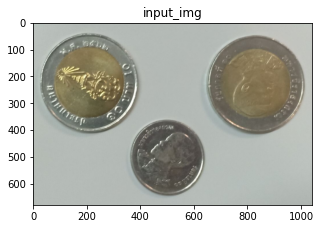

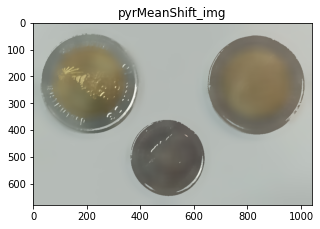

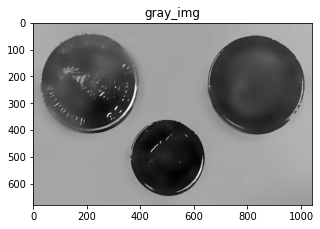

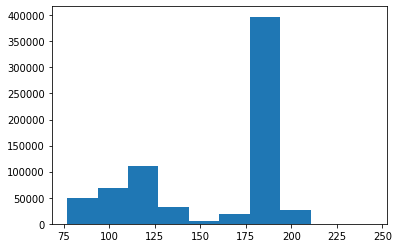

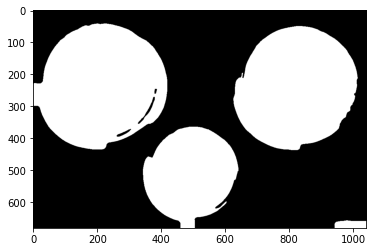

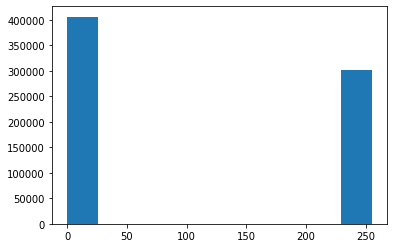

[[0 0 1 0 0]
 [0 1 1 1 0]
 [1 1 1 1 1]
 [0 1 1 1 0]
 [0 0 1 0 0]]


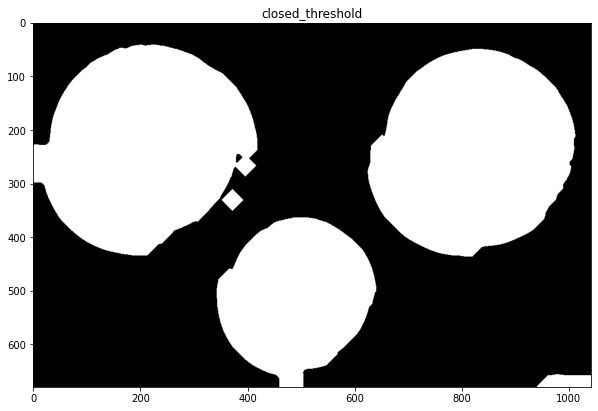

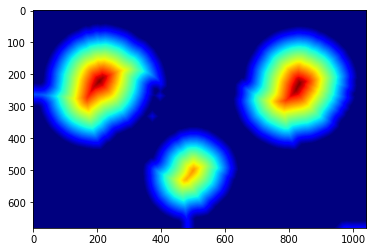

Max Distance: 173.35815


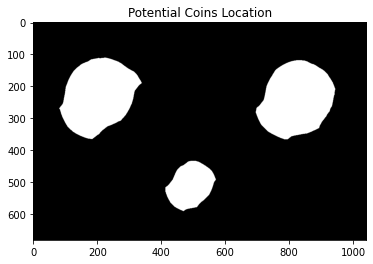

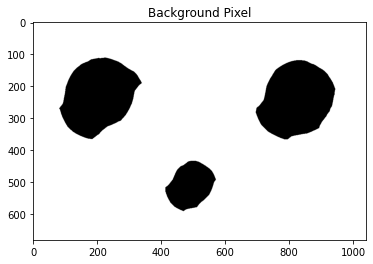

Min Label: 0 Max Label: 3


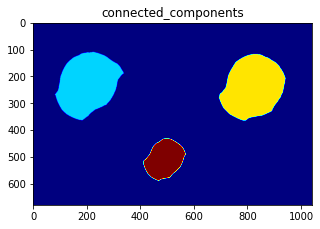

Min Label: -1 Max Label: 4


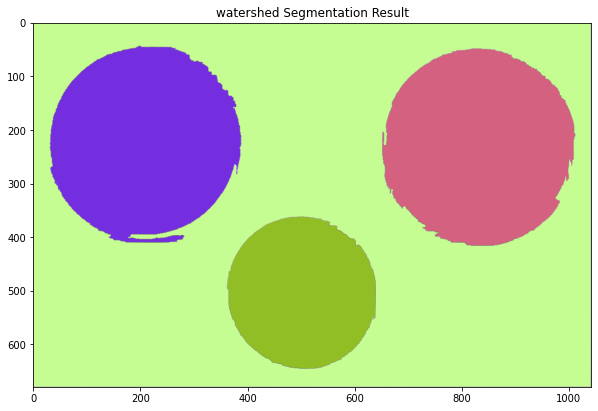

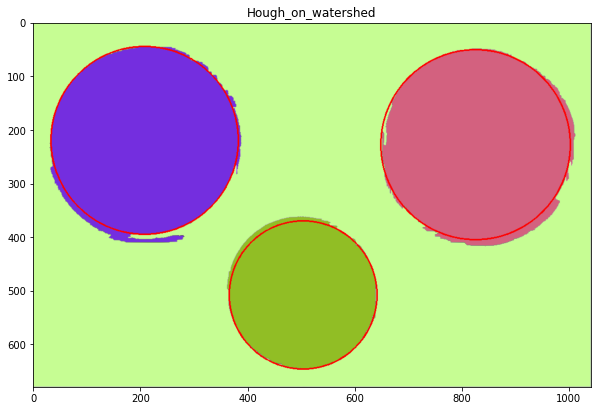

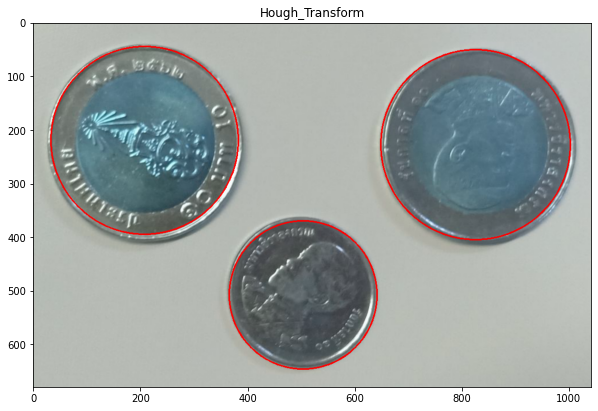

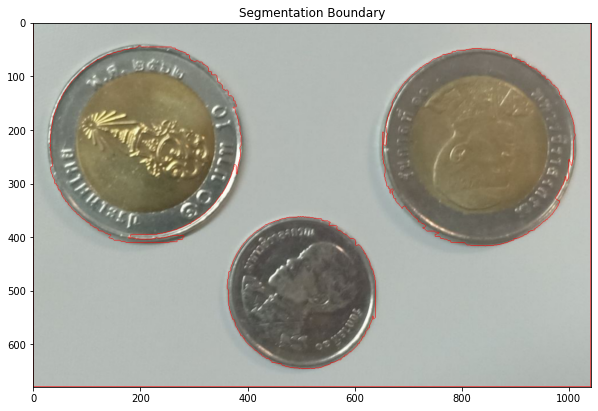

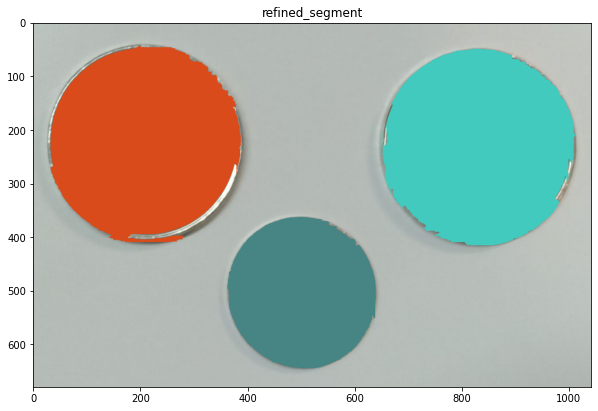

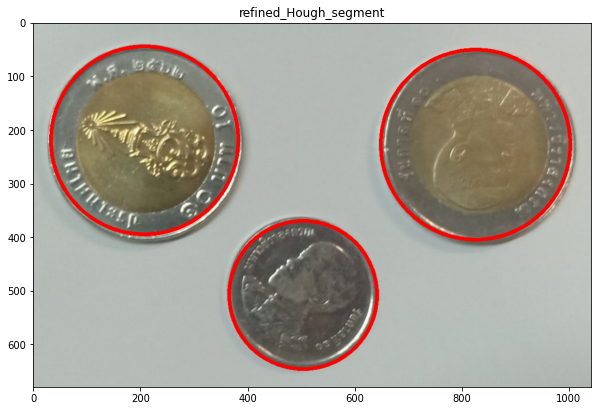

(350, 350, 3)
(276, 276, 3)
(354, 354, 3)
r: 175


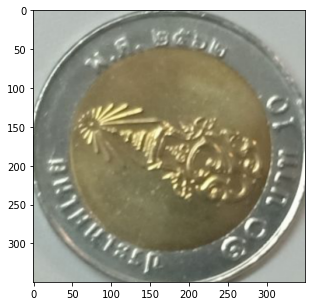

r: 138


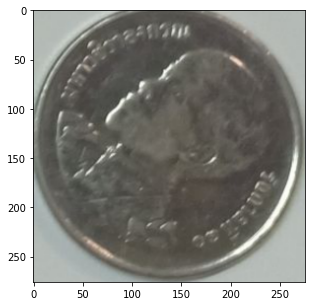

r: 177


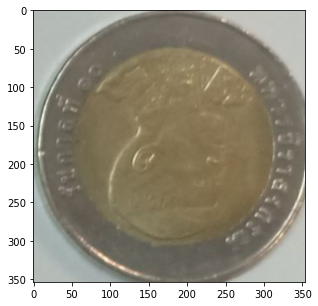

In [ ]:
img = cv2.imread("assets/mytest1.png")
detections_mytest1,coors_mytest1 = coin_segment(img,180,pyrMean_sp,pyrMean_sr,HCir_minDist,HCir_Canny,HCir_AcThres,HCir_minRadius,200)


In [327]:
"""
for detection and segmentation part:
- apply pyramid mean shift filtering and median filtering: to reduce detail of the image --> better thresholding
- apply thresholding 
- apply Distance Transform
- apply connected component algorithm 
- apply WaterShed algorithm
- apply Hough Circle Transform on the WaterShed result
- filter the false positive results out by using IOU between(watershed,Houghcircle)

"""

'\nfor detection and segmentation part:\n- apply pyramid mean shift filtering and median filtering: to reduce detail of the image --> better thresholding\n- apply thresholding \n- apply Distance Transform\n- apply connected component algorithm \n- apply WaterShed algorithm\n- apply Hough Circle Transform on the WaterShed result\n- filter the false positive results out by using IOU between(watershed,Houghcircle)\n\n'

In [329]:
'''
resource
 cv2.distanceTransform(thresholdCoinImage,cv2.DIST_L2, 3): 
 - https://www.tutorialspoint.com/opencv/opencv_distance_transformation.htm
watershed: 
- https://stackoverflow.com/questions/11294859/how-to-define-the-markers-for-watershed-in-opencv
- https://docs.opencv.org/3.3.1/d3/db4/tutorial_py_watershed.html
HoughTransform
- https://docs.opencv.org/2.4/modules/imgproc/doc/feature_detection.html?highlight=houghcircles#houghcircles
- https://stackoverflow.com/questions/60637120/detect-circles-in-opencv
pyrMeanShiftFiltering:
- https://www.pyimagesearch.com/2015/11/02/watershed-opencv/
thresholding:
- https://www.geeksforgeeks.org/python-thresholding-techniques-using-opencv-set-1-simple-thresholding/#:~:text=THRESH_BINARY_INV%20%3A%20Inverted%20or%20Opposite%20case,the%20same%20as%20the%20threshold.


